# Gradient and Boundary Analysis

Deep dive into the 40,401-point dataset (201×201 grid, α,β ∈ [-1, +1]).

**Analyses:**
1. High-resolution contour plot
2. Gradient magnitude map (reveals ALL boundaries)
3. Gradient direction field
4. Statistical properties of the landscape

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import sobel
from scipy import stats

## Load Data

In [23]:
# Load the massive dataset
df = pd.read_csv('data/2d_grid_results.csv')

print(f"Loaded {len(df):,} data points")
print(f"Alpha range: [{df['alpha'].min():.2f}, {df['alpha'].max():.2f}]")
print(f"Beta range: [{df['beta'].min():.2f}, {df['beta'].max():.2f}]")
print(f"Grade level range: [{df['flesch_kincaid_grade'].min():.2f}, {df['flesch_kincaid_grade'].max():.2f}]")
print(f"Grid resolution: {df['alpha'].nunique()} × {df['beta'].nunique()}")

# Reshape into 2D grid
pivot = df.pivot(index='beta', columns='alpha', values='flesch_kincaid_grade')
X = pivot.columns.values
Y = pivot.index.values
X_grid, Y_grid = np.meshgrid(X, Y)
Z = pivot.values

print(f"\nGrid shape: {Z.shape}")
print(f"Resolution: {X[1] - X[0]:.4f} units per step")

Loaded 40,401 data points
Alpha range: [-1.00, 1.00]
Beta range: [-1.00, 1.00]
Grade level range: [10.26, 14.53]
Grid resolution: 201 × 201

Grid shape: (201, 201)
Resolution: 0.0100 units per step


## 1. High-Resolution Contour Plot

Black and white topographic map showing the full [-1, +1] region.

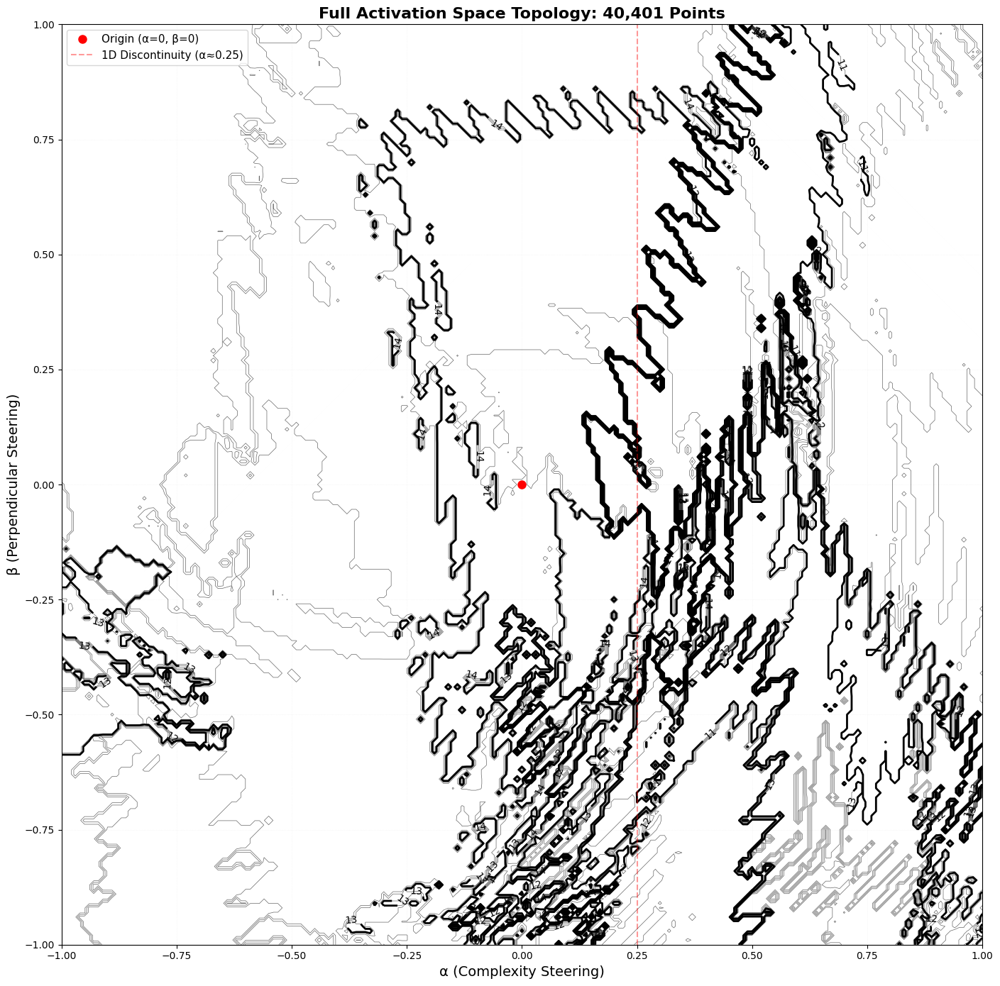

Contour density reveals gradient steepness:
  Dense contours = steep gradient (phase boundaries)
  Sparse contours = gentle gradient (stable regimes)


In [24]:
fig, ax = plt.subplots(figsize=(16, 14))

# Fine contours every 0.2 grade levels
levels_fine = np.arange(8, 16.2, 0.2)
contour_fine = ax.contour(X_grid, Y_grid, Z, levels=levels_fine, 
                          colors='black', linewidths=0.5, alpha=0.6)

# Major contours at integer grade levels
levels_major = np.arange(8, 17, 1)
contour_major = ax.contour(X_grid, Y_grid, Z, levels=levels_major, 
                           colors='black', linewidths=2)
ax.clabel(contour_major, inline=True, fontsize=10, fmt='%0.0f')

# Mark the origin
ax.plot(0, 0, 'ro', markersize=8, label='Origin (α=0, β=0)', zorder=5)

# Mark the 1D discontinuity
ax.axvline(0.25, color='red', linestyle='--', linewidth=1.5, alpha=0.4, 
          label='1D Discontinuity (α≈0.25)')

# Labels
ax.set_xlabel('α (Complexity Steering)', fontsize=14)
ax.set_ylabel('β (Perpendicular Steering)', fontsize=14)
ax.set_title('Full Activation Space Topology: 40,401 Points', fontsize=16, fontweight='bold')
ax.legend(loc='upper left', fontsize=11)
ax.grid(True, alpha=0.2, linestyle=':', linewidth=0.5)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

print("Contour density reveals gradient steepness:")
print("  Dense contours = steep gradient (phase boundaries)")
print("  Sparse contours = gentle gradient (stable regimes)")

## 2. Gradient Magnitude Map

Calculate ∇(grade_level) to find all boundaries and discontinuities.

Gradient statistics:
  Mean magnitude: 2.2434
  Std magnitude: 7.4346
  Max magnitude: 58.2483
  95th percentile: 8.9746


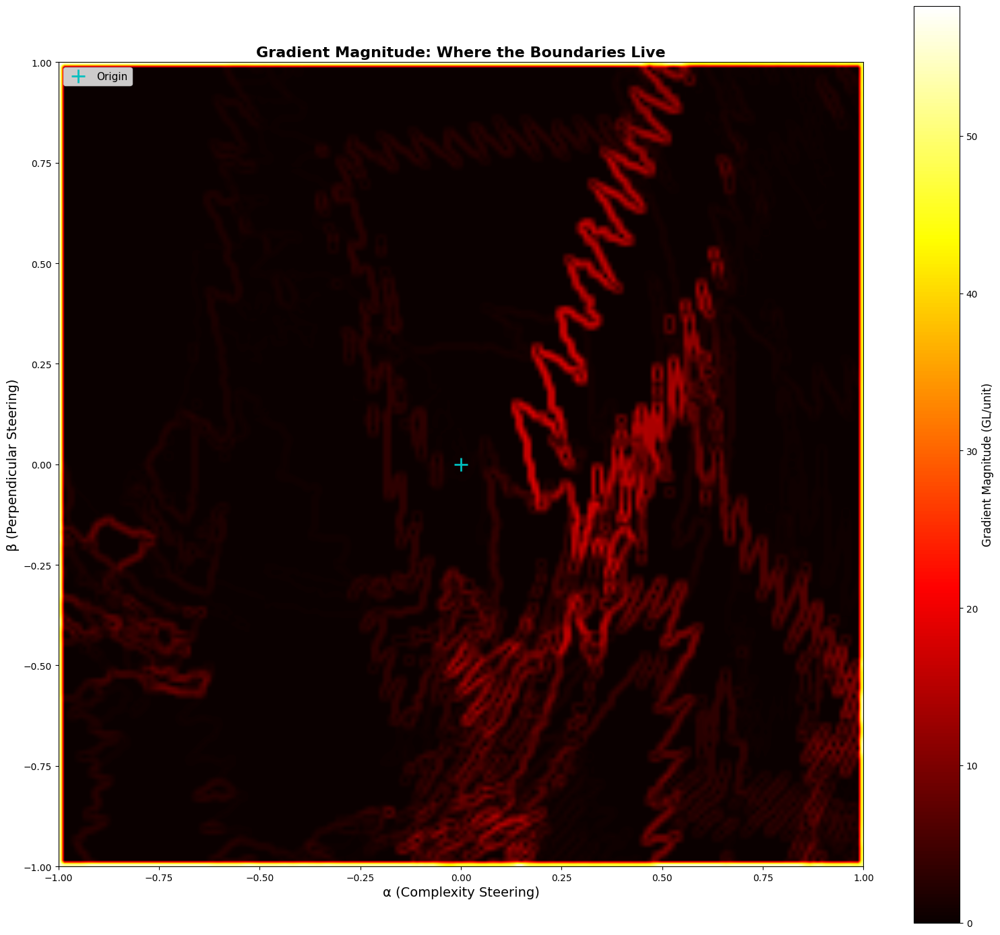


Bright regions = steep changes (discontinuities/boundaries)
Dark regions = flat terrain (stable attractors)


In [25]:
# Calculate gradients using Sobel operators
grad_alpha = sobel(Z, axis=1, mode='constant')  # Gradient in α direction
grad_beta = sobel(Z, axis=0, mode='constant')   # Gradient in β direction
grad_magnitude = np.sqrt(grad_alpha**2 + grad_beta**2)

print(f"Gradient statistics:")
print(f"  Mean magnitude: {grad_magnitude.mean():.4f}")
print(f"  Std magnitude: {grad_magnitude.std():.4f}")
print(f"  Max magnitude: {grad_magnitude.max():.4f}")
print(f"  95th percentile: {np.percentile(grad_magnitude, 95):.4f}")

# Plot gradient magnitude
fig, ax = plt.subplots(figsize=(16, 14))

# Use log scale to see both subtle and sharp boundaries
im = ax.imshow(grad_magnitude, cmap='hot', aspect='auto', origin='lower',
               extent=[-1, 1, -1, 1], interpolation='bilinear')

# Colorbar
cbar = plt.colorbar(im, ax=ax)
cbar.set_label('Gradient Magnitude (GL/unit)', fontsize=12)

# Mark origin
ax.plot(0, 0, 'c+', markersize=15, markeredgewidth=2, label='Origin')

# Labels
ax.set_xlabel('α (Complexity Steering)', fontsize=14)
ax.set_ylabel('β (Perpendicular Steering)', fontsize=14)
ax.set_title('Gradient Magnitude: Where the Boundaries Live', fontsize=16, fontweight='bold')
ax.legend(loc='upper left', fontsize=11)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

print("\nBright regions = steep changes (discontinuities/boundaries)")
print("Dark regions = flat terrain (stable attractors)")

## 3. Gradient Direction Field

Show which way the gradient points - the direction of steepest ascent.

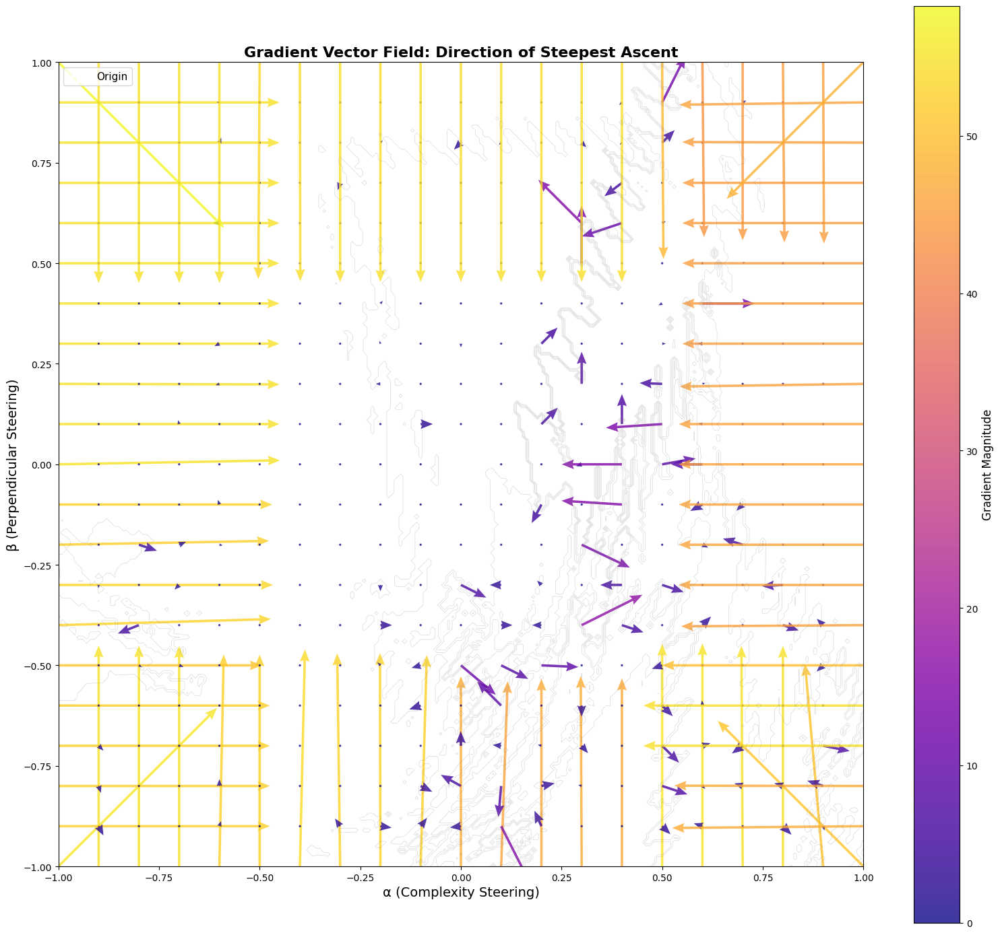

Arrows point in direction of increasing grade level
Arrow color/length indicates gradient strength


In [26]:
# Subsample for visualization (every Nth point)
skip = 10  # Show every 10th point
X_sub = X_grid[::skip, ::skip]
Y_sub = Y_grid[::skip, ::skip]
U_sub = grad_alpha[::skip, ::skip]
V_sub = grad_beta[::skip, ::skip]
M_sub = grad_magnitude[::skip, ::skip]

fig, ax = plt.subplots(figsize=(16, 14))

# Background: grade level as faint contours
levels_bg = np.arange(8, 17, 1)
ax.contour(X_grid, Y_grid, Z, levels=levels_bg, 
          colors='gray', linewidths=0.5, alpha=0.3)

# Quiver plot colored by gradient magnitude
quiv = ax.quiver(X_sub, Y_sub, U_sub, V_sub, M_sub,
                cmap='plasma', scale=200, width=0.003, 
                headwidth=4, headlength=5, alpha=0.8)

# Colorbar
cbar = plt.colorbar(quiv, ax=ax)
cbar.set_label('Gradient Magnitude', fontsize=12)

# Mark origin
ax.plot(0, 0, 'w+', markersize=15, markeredgewidth=3, label='Origin')

# Labels
ax.set_xlabel('α (Complexity Steering)', fontsize=14)
ax.set_ylabel('β (Perpendicular Steering)', fontsize=14)
ax.set_title('Gradient Vector Field: Direction of Steepest Ascent', fontsize=16, fontweight='bold')
ax.legend(loc='upper left', fontsize=11)
ax.set_aspect('equal')
ax.set_xlim(-1, 1)
ax.set_ylim(-1, 1)

plt.tight_layout()
plt.show()

print("Arrows point in direction of increasing grade level")
print("Arrow color/length indicates gradient strength")

## 4. Statistical Landscape Analysis

Characterize the overall topology.

Grade Level Distribution:
  Mean: 12.98
  Median: 13.54
  Std: 1.18
  Min: 10.26
  Max: 14.53
  Range: 4.27
  Skewness: -0.81
  Kurtosis: -0.77


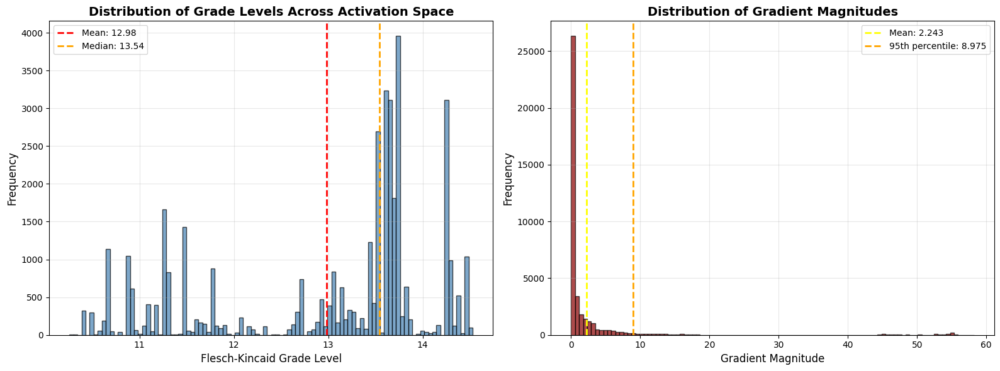


Terrain Classification (threshold = 75th percentile):
  Flat regions: 75.0%
  Steep regions (boundaries): 25.0%


In [27]:
# Basic statistics
print("Grade Level Distribution:")
print(f"  Mean: {Z.mean():.2f}")
print(f"  Median: {np.median(Z):.2f}")
print(f"  Std: {Z.std():.2f}")
print(f"  Min: {Z.min():.2f}")
print(f"  Max: {Z.max():.2f}")
print(f"  Range: {Z.max() - Z.min():.2f}")
print(f"  Skewness: {stats.skew(Z.flatten()):.2f}")
print(f"  Kurtosis: {stats.kurtosis(Z.flatten()):.2f}")

# Histogram
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Grade level histogram
ax1.hist(Z.flatten(), bins=100, color='steelblue', edgecolor='black', alpha=0.7)
ax1.axvline(Z.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {Z.mean():.2f}')
ax1.axvline(np.median(Z), color='orange', linestyle='--', linewidth=2, label=f'Median: {np.median(Z):.2f}')
ax1.set_xlabel('Flesch-Kincaid Grade Level', fontsize=12)
ax1.set_ylabel('Frequency', fontsize=12)
ax1.set_title('Distribution of Grade Levels Across Activation Space', fontsize=14, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Gradient magnitude histogram
ax2.hist(grad_magnitude.flatten(), bins=100, color='darkred', edgecolor='black', alpha=0.7)
ax2.axvline(grad_magnitude.mean(), color='yellow', linestyle='--', linewidth=2, 
           label=f'Mean: {grad_magnitude.mean():.3f}')
ax2.axvline(np.percentile(grad_magnitude, 95), color='orange', linestyle='--', linewidth=2,
           label=f'95th percentile: {np.percentile(grad_magnitude, 95):.3f}')
ax2.set_xlabel('Gradient Magnitude', fontsize=12)
ax2.set_ylabel('Frequency', fontsize=12)
ax2.set_title('Distribution of Gradient Magnitudes', fontsize=14, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Count how much of the space is "flat" vs "steep"
threshold = np.percentile(grad_magnitude, 75)
flat_fraction = (grad_magnitude < threshold).sum() / grad_magnitude.size
steep_fraction = 1 - flat_fraction

print(f"\nTerrain Classification (threshold = 75th percentile):")
print(f"  Flat regions: {flat_fraction*100:.1f}%")
print(f"  Steep regions (boundaries): {steep_fraction*100:.1f}%")

## 5. Radial Analysis

How does grade level vary with distance from origin?

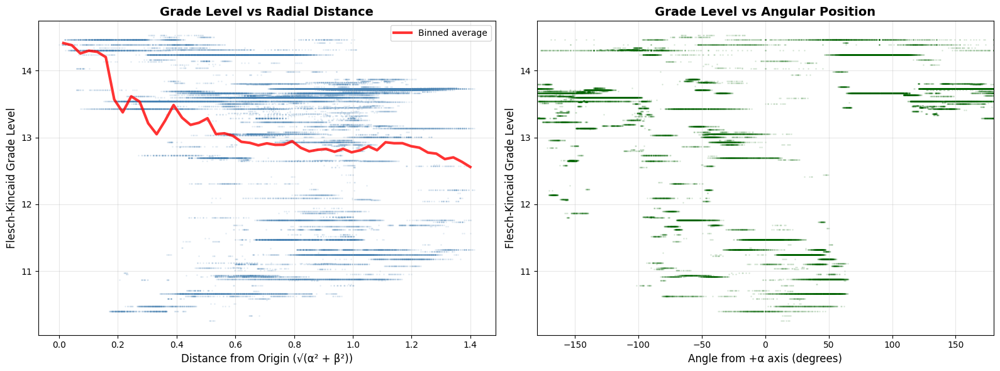

Radial symmetry check: Does grade level depend on distance from origin?
Angular symmetry check: Does it depend on direction?


In [28]:
# Calculate distance from origin for each point
df['distance'] = np.sqrt(df['alpha']**2 + df['beta']**2)
df['angle'] = np.arctan2(df['beta'], df['alpha']) * 180 / np.pi  # In degrees

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Grade level vs distance from origin
ax1.scatter(df['distance'], df['flesch_kincaid_grade'], 
           alpha=0.1, s=1, c='steelblue')
ax1.set_xlabel('Distance from Origin (√(α² + β²))', fontsize=12)
ax1.set_ylabel('Flesch-Kincaid Grade Level', fontsize=12)
ax1.set_title('Grade Level vs Radial Distance', fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3)

# Binned average
distance_bins = np.linspace(0, df['distance'].max(), 50)
binned_stats = stats.binned_statistic(df['distance'], df['flesch_kincaid_grade'], 
                                      statistic='mean', bins=distance_bins)
bin_centers = (distance_bins[:-1] + distance_bins[1:]) / 2
ax1.plot(bin_centers, binned_stats.statistic, 'r-', linewidth=3, 
        label='Binned average', alpha=0.8)
ax1.legend()

# Grade level vs angle
ax2.scatter(df['angle'], df['flesch_kincaid_grade'], 
           alpha=0.1, s=1, c='darkgreen')
ax2.set_xlabel('Angle from +α axis (degrees)', fontsize=12)
ax2.set_ylabel('Flesch-Kincaid Grade Level', fontsize=12)
ax2.set_title('Grade Level vs Angular Position', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)
ax2.set_xlim(-180, 180)

plt.tight_layout()
plt.show()

print("Radial symmetry check: Does grade level depend on distance from origin?")
print("Angular symmetry check: Does it depend on direction?")

## 6. Interactive 3D Visualization

Explore the activation space landscape interactively using Plotly.

In [29]:
import plotly.graph_objects as go

# Load fresh data (in case running this cell standalone)
df_plot = pd.read_csv('data/2d_grid_results.csv')

print(f"Creating interactive 3D plot with {len(df_plot):,} points...")

# Create 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=df_plot['alpha'],
    y=df_plot['beta'],
    z=df_plot['flesch_kincaid_grade'],
    mode='markers',
    marker=dict(
        size=2,
        color=df_plot['flesch_kincaid_grade'],
        colorscale='Viridis',
        showscale=True,
        colorbar=dict(title="Grade Level"),
        opacity=0.8
    ),
    text=[f"α={a:.2f}<br>β={b:.2f}<br>GL={g:.2f}" 
          for a, b, g in zip(df_plot['alpha'], df_plot['beta'], df_plot['flesch_kincaid_grade'])],
    hoverinfo='text'
)])

# Layout
fig.update_layout(
    title='Interactive 3D Activation Space Landscape',
    scene=dict(
        xaxis_title='α (Complexity Steering)',
        yaxis_title='β (Perpendicular Steering)',
        zaxis_title='Flesch-Kincaid Grade Level',
        camera=dict(
            eye=dict(x=1.5, y=1.5, z=1.3)
        )
    ),
    width=1200,
    height=900,
    hovermode='closest'
)

fig.show()

print("\\nInteractive controls:")
print("  • Click and drag to rotate")
print("  • Scroll to zoom")
print("  • Hover over points to see exact values")
print("  • Use the camera controls in the toolbar")

Creating interactive 3D plot with 40,401 points...


\nInteractive controls:
  • Click and drag to rotate
  • Scroll to zoom
  • Hover over points to see exact values
  • Use the camera controls in the toolbar


In [30]:
# Alternative: 3D surface plot (smoother visualization)
# This interpolates between points for a continuous surface

# Reshape data
pivot_3d = df_plot.pivot(index='beta', columns='alpha', values='flesch_kincaid_grade')
X_3d = pivot_3d.columns.values
Y_3d = pivot_3d.index.values
Z_3d = pivot_3d.values

fig_surface = go.Figure(data=[go.Surface(
    x=X_3d,
    y=Y_3d,
    z=Z_3d,
    colorscale='Viridis',
    colorbar=dict(title="Grade Level"),
    hovertemplate='α: %{x:.2f}<br>β: %{y:.2f}<br>GL: %{z:.2f}<extra></extra>'
)])

fig_surface.update_layout(
    title='Interactive 3D Surface: Activation Space Landscape',
    scene=dict(
        xaxis_title='α (Complexity Steering)',
        yaxis_title='β (Perpendicular Steering)',
        zaxis_title='Flesch-Kincaid Grade Level',
        camera=dict(
            eye=dict(x=1.5, y=1.5, z=1.3)
        )
    ),
    width=1200,
    height=900
)

fig_surface.show()

print("\\nSurface plot shows the continuous landscape.")
print("Rotate it to see the sawtooth boundary from different angles!")

\nSurface plot shows the continuous landscape.
Rotate it to see the sawtooth boundary from different angles!


In [31]:
# Flattened version: Scale down the Z-axis for easier interpretation
# This compresses vertical differences to see the overall structure better

Z_SCALE_FACTOR = 0.1  # Compress vertical scale by 10x

# Scatter plot - flattened with reference planes
fig_scatter_flat = go.Figure()

# Add the data points
fig_scatter_flat.add_trace(go.Scatter3d(
    x=df_plot['alpha'],
    y=df_plot['beta'],
    z=df_plot['flesch_kincaid_grade'] * Z_SCALE_FACTOR,
    mode='markers',
    marker=dict(
        size=2,
        color=df_plot['flesch_kincaid_grade'],
        colorscale='Viridis',
        showscale=True,
        colorbar=dict(title="Grade Level<br>(actual)"),
        opacity=0.8
    ),
    text=[f"α={a:.2f}<br>β={b:.2f}<br>GL={g:.2f}" 
          for a, b, g in zip(df_plot['alpha'], df_plot['beta'], df_plot['flesch_kincaid_grade'])],
    hoverinfo='text',
    name='Data'
))

# Add β=0 plane (translucent)
z_range = [df_plot['flesch_kincaid_grade'].min() * Z_SCALE_FACTOR, 
           df_plot['flesch_kincaid_grade'].max() * Z_SCALE_FACTOR]
fig_scatter_flat.add_trace(go.Surface(
    x=[-1, 1],
    y=[0, 0],
    z=[[z_range[0], z_range[0]], [z_range[1], z_range[1]]],
    showscale=False,
    opacity=0.2,
    colorscale=[[0, 'lightblue'], [1, 'lightblue']],
    name='β=0 plane',
    hoverinfo='skip'
))

# Add α=0 plane (translucent)
fig_scatter_flat.add_trace(go.Surface(
    x=[0, 0],
    y=[-1, 1],
    z=[[z_range[0], z_range[0]], [z_range[1], z_range[1]]],
    showscale=False,
    opacity=0.2,
    colorscale=[[0, 'pink'], [1, 'pink']],
    name='α=0 plane',
    hoverinfo='skip'
))

fig_scatter_flat.update_layout(
    title=f'Interactive 3D Scatter (Z-axis scaled {Z_SCALE_FACTOR}x) with Reference Planes',
    scene=dict(
        xaxis_title='α (Complexity Steering)',
        yaxis_title='β (Perpendicular Steering)',
        zaxis_title=f'Grade Level (×{Z_SCALE_FACTOR})',
        camera=dict(
            eye=dict(x=1.5, y=1.5, z=1.3)
        ),
        aspectmode='manual',
        aspectratio=dict(x=1, y=1, z=0.5)  # Make Z axis relatively shorter
    ),
    width=1200,
    height=900,
    hovermode='closest'
)

fig_scatter_flat.show()

# Surface plot - flattened with reference planes
Z_3d_flat = Z_3d * Z_SCALE_FACTOR

fig_surface_flat = go.Figure()

# Add the surface
fig_surface_flat.add_trace(go.Surface(
    x=X_3d,
    y=Y_3d,
    z=Z_3d_flat,
    surfacecolor=Z_3d,  # Color by actual values
    colorscale='Viridis',
    colorbar=dict(title="Grade Level<br>(actual)"),
    hovertemplate='α: %{x:.2f}<br>β: %{y:.2f}<br>GL: %{surfacecolor:.2f}<extra></extra>',
    name='Grade Level Surface'
))

# Add β=0 plane (translucent)
fig_surface_flat.add_trace(go.Surface(
    x=[-1, 1],
    y=[0, 0],
    z=[[z_range[0], z_range[0]], [z_range[1], z_range[1]]],
    showscale=False,
    opacity=0.2,
    colorscale=[[0, 'lightblue'], [1, 'lightblue']],
    name='β=0 plane',
    hoverinfo='skip'
))

# Add α=0 plane (translucent)
fig_surface_flat.add_trace(go.Surface(
    x=[0, 0],
    y=[-1, 1],
    z=[[z_range[0], z_range[0]], [z_range[1], z_range[1]]],
    showscale=False,
    opacity=0.2,
    colorscale=[[0, 'pink'], [1, 'pink']],
    name='α=0 plane',
    hoverinfo='skip'
))

fig_surface_flat.update_layout(
    title=f'Interactive 3D Surface (Z-axis scaled {Z_SCALE_FACTOR}x) with Reference Planes',
    scene=dict(
        xaxis_title='α (Complexity Steering)',
        yaxis_title='β (Perpendicular Steering)',
        zaxis_title=f'Grade Level (×{Z_SCALE_FACTOR})',
        camera=dict(
            eye=dict(x=1.5, y=1.5, z=1.3)
        ),
        aspectmode='manual',
        aspectratio=dict(x=1, y=1, z=0.5)
    ),
    width=1200,
    height=900
)

fig_surface_flat.show()

print(f"\nZ-axis compressed by factor of {Z_SCALE_FACTOR} for easier interpretation")
print("Colors still represent actual grade level values")
print("\nReference planes:")
print("  • Light blue plane: β=0 (pure complexity steering)")
print("  • Pink plane: α=0 (pure perpendicular steering)")
print("\nThese help you see where you cross the axes as you rotate the view!")


Z-axis compressed by factor of 0.1 for easier interpretation
Colors still represent actual grade level values

Reference planes:
  • Light blue plane: β=0 (pure complexity steering)
  • Pink plane: α=0 (pure perpendicular steering)

These help you see where you cross the axes as you rotate the view!
